In [1]:
import sys
sys.path.append('/SAN/colcc/Hormad1/projects/MINOTAUR/')
sys.path.append('/SAN/colcc/Hormad1/projects/MINOTAUR/tiler')

In [2]:
import glob
import os
import random


import sklearn
import PIL
import numpy as np
import pandas as pd
import itertools
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

import tiler
from tiler.lmdb_io import LMDBRead

In [3]:
UNI_PATH = '/SAN/colcc/Hormad1/data/embeddings/uni/224-20x-0.2/features/'
GIGAPATH_PATH = '/SAN/colcc/Hormad1/data/embeddings/gigapath/224-20x-0.2/features/'
VIRCHOW2_PATH = '/SAN/colcc/Hormad1/data/embeddings/virchow2/224-20x-0.2/features/'
HIBOUL_PATH = '/SAN/colcc/Hormad1/data/embeddings/hibou-l/224-20x-0.2/features/'

In [4]:
clinical = pd.read_csv('/SAN/colcc/Hormad1/data/clinical/clinical.tsv', sep='\t')

In [5]:
tissue_map = dict(zip(list(clinical['case_submitter_id']), list(clinical['project_id'])))

In [6]:
uni_tcga_paths = glob.glob(os.path.join(UNI_PATH, '*'))
uni_tcga_paths = [t for t in uni_tcga_paths if 'TCGA' in t]
gigapath_tcga_paths = glob.glob(os.path.join(GIGAPATH_PATH, '*'))
gigapath_tcga_paths = [t for t in gigapath_tcga_paths if 'TCGA' in t]
virchow2_tcga_paths = glob.glob(os.path.join(VIRCHOW2_PATH, '*'))
virchow2_tcga_paths = [t for t in virchow2_tcga_paths if 'TCGA' in t]
hiboul_tcga_paths = glob.glob(os.path.join(HIBOUL_PATH, '*'))
hiboul_tcga_paths = [t for t in hiboul_tcga_paths if 'TCGA' in t]

In [7]:
def get_embeddings(path):
    read = LMDBRead(path)
    read.get_keys()
    embeddings, labels = [], []
    for k in read.get_keys():
        labels.append(os.path.basename(path)[:-4])
        image = read.read_image(k)
        embeddings.append(image)
            
    return embeddings, labels

In [8]:
def sample_embeddings(embeddings, labels):
    labeled_embeds = list(zip(embeddings,labels))
    labeled_embeds  = random.sample(labeled_embeds,10000)
    s_embeddings, s_labels = zip(*labeled_embeds)
    sampled_matrix = np.vstack(s_embeddings)
    return sampled_matrix, s_labels

In [9]:
def encode_labels(labels):
    unique_labels = sorted(set(labels))
    label_mapping = {label: idx for idx, label in enumerate(unique_labels)}
    int_labels = [label_mapping[label] for label in labels]
    labels_id = list(label_mapping.keys())
    return int_labels, labels_id

In [10]:
def get_tsne(matrix, dim=2):
    tsne = TSNE(n_components=dim, random_state=42)
    embedd_dims = tsne.fit_transform(matrix)
    return embedd_dims

In [11]:
def get_model_embeds(paths):
    sampled_paths=random.sample(paths,500)
    tcga_embeds, tcga_labels = [], []
    for i, p in enumerate(sampled_paths):
        embeddings, labels = get_embeddings(p)
        tcga_embeds.append(embeddings)
        tcga_labels.append(labels)
    return tcga_embeds, tcga_labels

### GigaPath

In [12]:
gigapath_tcga_paths = [p for p in gigapath_tcga_paths if os.listdir(p)]

In [13]:
tcga_embeds, tcga_labels = get_model_embeds(gigapath_tcga_paths)

In [14]:
chained_tcga_embeds = list(itertools.chain(*tcga_embeds))
chained_tcga_labels = list(itertools.chain(*tcga_labels))

In [15]:
chained_tcga_labels = [tissue_map[l] for l in chained_tcga_labels]

In [16]:
sampled_matrix, s_labels = sample_embeddings(
    chained_tcga_embeds, 
    chained_tcga_labels
)

In [17]:
int_labels, labels_id = encode_labels(s_labels)
embeddings_2d = get_tsne(sampled_matrix, dims)

In [18]:
labels_id

['TCGA-BRCA',
 'TCGA-COAD',
 'TCGA-DLBC',
 'TCGA-HNSC',
 'TCGA-KICH',
 'TCGA-KIRC',
 'TCGA-KIRP',
 'TCGA-LUAD',
 'TCGA-LUSC',
 'TCGA-PAAD',
 'TCGA-PRAD',
 'TCGA-READ']

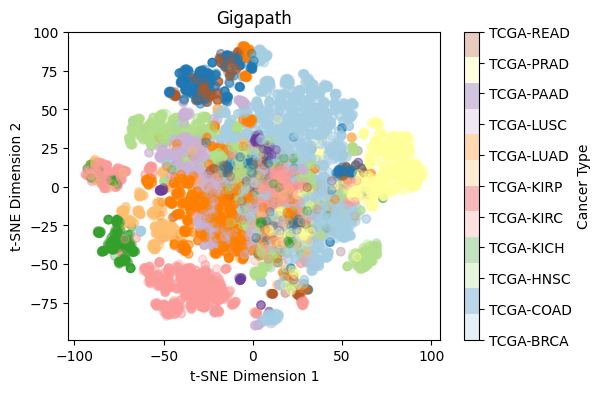

In [34]:
plt.figure(figsize=(6, 4))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=int_labels, cmap='Paired', alpha=0.3)
colorbar =  plt.colorbar(scatter, ticks=range(11), label='Cancer Type')
colorbar.set_ticklabels(labels_id)
colorbar.set_label('Cancer Type')

plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('Gigapath')
plt.savefig('gigapath-tsne-cancer.png')
plt.show()

In [19]:
from mpl_toolkits.mplot3d import Axes3D 

In [29]:
embeddings_3d = get_tsne(sampled_matrix, 3)

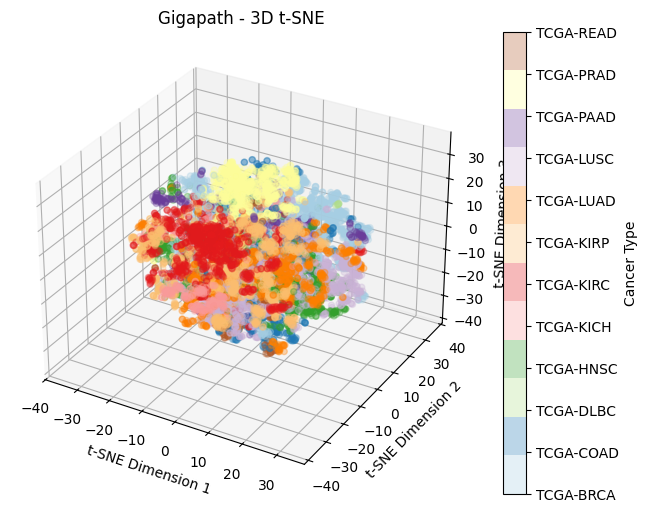

In [31]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Create scatter plot
scatter = ax.scatter(
    embeddings_3d[:, 0],
    embeddings_3d[:, 1],
    embeddings_3d[:, 2],
    c=int_labels,
    cmap='Paired',
    alpha=0.3
)

# Add colorbar
colorbar = fig.colorbar(scatter, ticks=range(12), label='Cancer Type')
colorbar.set_ticklabels(labels_id)
colorbar.set_label('Cancer Type')

# Axis labels and title
ax.set_xlabel('t-SNE Dimension 1')
ax.set_ylabel('t-SNE Dimension 2')
ax.set_zlabel('t-SNE Dimension 3')
ax.set_title('Gigapath - 3D t-SNE')

plt.savefig('gigapath-tsne-cancer-3d.png')
plt.show()

### UNI-2

In [12]:
tcga_embeds, tcga_labels = get_model_embeds(uni_tcga_paths)

In [13]:
chained_tcga_embeds = list(itertools.chain(*tcga_embeds))
chained_tcga_labels = list(itertools.chain(*tcga_labels))

chained_tcga_labels = [tissue_map[l] for l in chained_tcga_labels]

In [14]:
sampled_matrix, s_labels = sample_embeddings(
    chained_tcga_embeds, 
    chained_tcga_labels
)

In [19]:
int_labels, labels_id = encode_labels(s_labels)
embeddings_2d = get_tsne(sampled_matrix)

In [20]:
labels_id

['TCGA-BRCA',
 'TCGA-COAD',
 'TCGA-HNSC',
 'TCGA-KICH',
 'TCGA-KIRC',
 'TCGA-KIRP',
 'TCGA-LUAD',
 'TCGA-LUSC',
 'TCGA-PAAD',
 'TCGA-PCPG',
 'TCGA-PRAD',
 'TCGA-READ',
 'TCGA-SARC']

ValueError: The number of FixedLocator locations (12), usually from a call to set_ticks, does not match the number of labels (13).

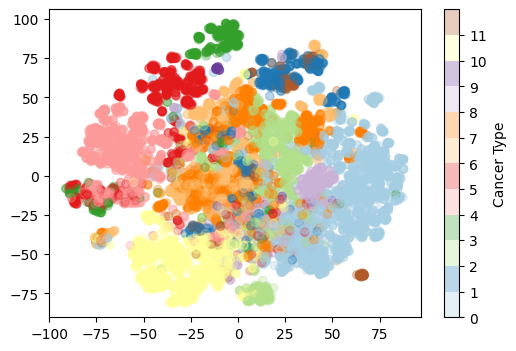

In [22]:
plt.figure(figsize=(6, 4))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=int_labels, cmap='Paired', alpha=0.3)
colorbar =  plt.colorbar(scatter, ticks=range(12), label='Cancer Type')
colorbar.set_ticklabels(labels_id)
colorbar.set_label('Cancer Type')

plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('UNI-2')
#plt.savefig('uni-tsne-cancer.png')
plt.show()

In [23]:
embeddings_3d = get_tsne(sampled_matrix, 3)

ValueError: The number of FixedLocator locations (12), usually from a call to set_ticks, does not match the number of labels (13).

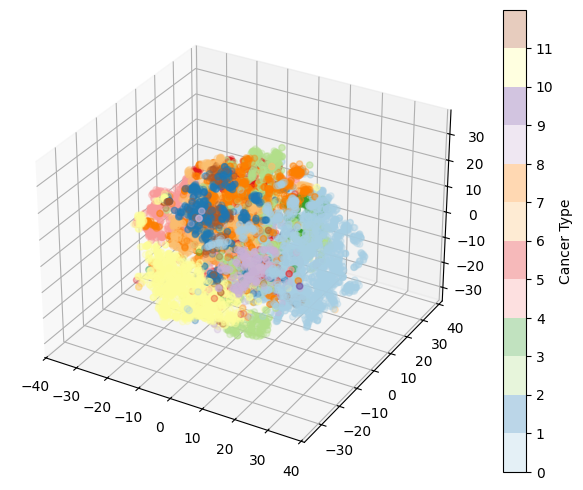

In [24]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Create scatter plot
scatter = ax.scatter(
    embeddings_3d[:, 0],
    embeddings_3d[:, 1],
    embeddings_3d[:, 2],
    c=int_labels,
    cmap='Paired',
    alpha=0.3
)

# Add colorbar
colorbar = fig.colorbar(scatter, ticks=range(12), label='Cancer Type')
colorbar.set_ticklabels(labels_id)
colorbar.set_label('Cancer Type')

# Axis labels and title
ax.set_xlabel('t-SNE Dimension 1')
ax.set_ylabel('t-SNE Dimension 2')
ax.set_zlabel('t-SNE Dimension 3')
ax.set_title('UNI - 3D t-SNE')

plt.savefig('uni-tsne-cancer-3d.png')
plt.show()

### Virchow2

In [12]:
tcga_embeds, tcga_labels = get_model_embeds(virchow2_tcga_paths)

In [13]:
chained_tcga_embeds = list(itertools.chain(*tcga_embeds))
chained_tcga_labels = list(itertools.chain(*tcga_labels))

In [14]:
chained_tcga_embeds = list(itertools.chain(*tcga_embeds))
chained_tcga_labels = list(itertools.chain(*tcga_labels))

chained_tcga_labels = [tissue_map[l] for l in chained_tcga_labels]

In [15]:
sampled_matrix, s_labels = sample_embeddings(
    chained_tcga_embeds, 
    chained_tcga_labels
)

In [16]:
int_labels, labels_id = encode_labels(s_labels)
#embeddings_2d = get_tsne(sampled_matrix)

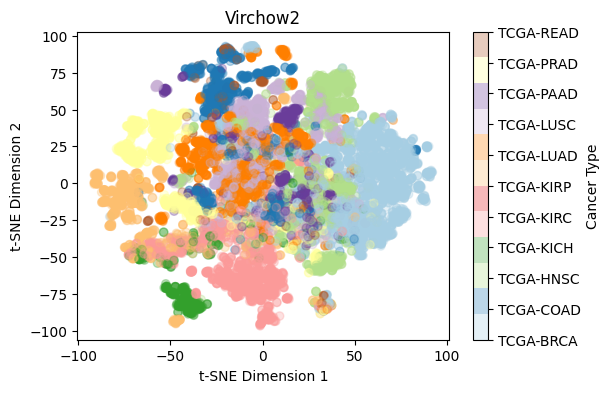

In [64]:
plt.figure(figsize=(6, 4))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=int_labels, cmap='Paired', alpha=0.3)
colorbar =  plt.colorbar(scatter, ticks=range(11), label='Cancer Type')
colorbar.set_ticklabels(labels_id)
colorbar.set_label('Cancer Type')

plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('Virchow2')
plt.savefig('virchow-tsne-cancer.png')
plt.show()

In [17]:
embeddings_3d = get_tsne(sampled_matrix, 3)

NameError: name 'pd' is not defined

In [2]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Create scatter plot
scatter = ax.scatter(
    embeddings_3d[:, 0],
    embeddings_3d[:, 1],
    embeddings_3d[:, 2],
    c=int_labels,
    cmap='Paired',
    alpha=0.3
)

# Add colorbar
colorbar = fig.colorbar(scatter, ticks=range(12), label='Cancer Type')
colorbar.set_ticklabels(labels_id)
colorbar.set_label('Cancer Type')

# Axis labels and title
ax.set_xlabel('t-SNE Dimension 1')
ax.set_ylabel('t-SNE Dimension 2')
ax.set_zlabel('t-SNE Dimension 3')
ax.set_title('UNI - 3D t-SNE')

plt.savefig('virchow-tsne-cancer-3d.png')
plt.show()

NameError: name 'plt' is not defined

### HibouL

In [66]:
tcga_embeds, tcga_labels = get_model_embeds(uni_tcga_paths)

In [67]:
chained_tcga_embeds = list(itertools.chain(*tcga_embeds))
chained_tcga_labels = list(itertools.chain(*tcga_labels))

In [68]:
chained_tcga_embeds = list(itertools.chain(*tcga_embeds))
chained_tcga_labels = list(itertools.chain(*tcga_labels))

chained_tcga_labels = [tissue_map[l] for l in chained_tcga_labels]

In [69]:
sampled_matrix, s_labels = sample_embeddings(
    chained_tcga_embeds, 
    chained_tcga_labels
)

In [70]:
int_labels, labels_id = encode_labels(s_labels)
embeddings_2d = get_tsne(sampled_matrix)

In [72]:
labels_id

['TCGA-BRCA',
 'TCGA-COAD',
 'TCGA-HNSC',
 'TCGA-KICH',
 'TCGA-KIRC',
 'TCGA-KIRP',
 'TCGA-LUAD',
 'TCGA-LUSC',
 'TCGA-PAAD',
 'TCGA-PRAD',
 'TCGA-READ',
 'TCGA-SARC']

ValueError: The number of FixedLocator locations (11), usually from a call to set_ticks, does not match the number of labels (12).

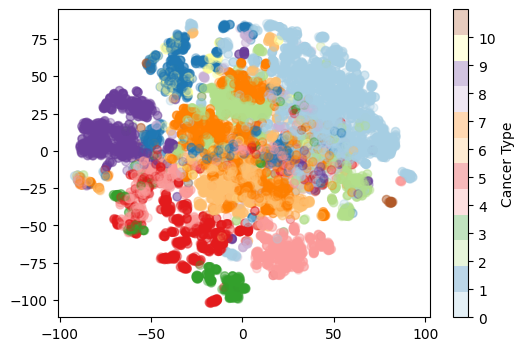

In [71]:
plt.figure(figsize=(6, 4))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=int_labels, cmap='Paired', alpha=0.3)
colorbar =  plt.colorbar(scatter, ticks=range(11), label='Cancer Type')
colorbar.set_ticklabels(labels_id)
colorbar.set_label('Cancer Type')

plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('Hibou-L')
plt.savefig('hibou-L-tsne-cancer.png')
plt.show()

In [28]:
for p in gigapath_tcga_paths:
    paths = glob.glob(os.path.join(p,'*'))
    for c_p in paths:
        
        

#sampled_matrix, s_labels = sample_embeddings(embeddings, labels)
#int_labels, labels_id = encode_labels(s_labels)
#embeddings_2d = get_tsne(sampled_matrix)

In [29]:
embeddings

NameError: name 'embeddings' is not defined

ValueError: The number of FixedLocator locations (10), usually from a call to set_ticks, does not match the number of labels (44).

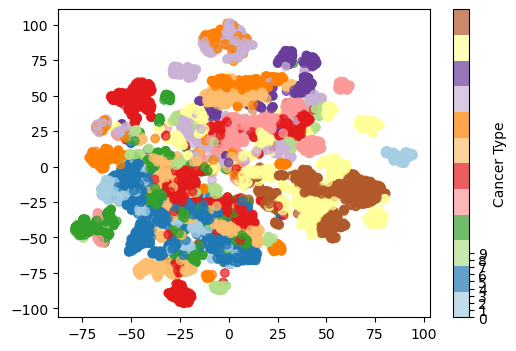

In [38]:
plt.figure(figsize=(6, 4))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=int_labels, cmap='Paired', alpha=0.7)
colorbar =  plt.colorbar(scatter, ticks=range(10), label='Cancer Type')

colorbar.set_ticklabels(labels_id)
colorbar.set_label('Cancer Type')

plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('t-SNE of Embeddings of UNI Across Cancer Types')
plt.savefig('tsne-cancer.png')
plt.show()

In [132]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage, dendrogram

In [133]:
labeled_embeds = list(zip(embeddings,cancer_type))
labeled_embeds  = random.sample(labeled_embeds,10000)

In [134]:
#complete_clustering = linkage(sampled_matrix, method="complete", metric="euclidean")
#average_clustering = linkage(sampled_matrix, method="average", metric="euclidean")
#single_clustering = linkage(sampled_matrix, method="single", metric="euclidean")
ward_clustering = linkage(sampled_matrix, method='ward', metric="euclidean")
dendrogram(ward)
plt.show()

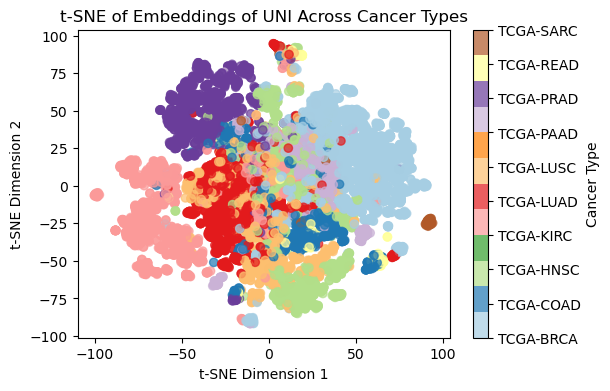

In [14]:
#reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
#embeddings_2d = redaucer.fit_transform(embeddings)

/home/clinical-concepts/maracuja.clinical-concepts/miniconda3/envs/preprocessing/lib/python3.12/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/home/clinical-concepts/maracuja.clinical-concepts/miniconda3/envs/preprocessing/lib/python3.12/site-packages/numba/np/ufunc/dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.warn(msg, errors.NumbaWarning)
/home/clinical-concepts/maracuja.clinical-concepts/miniconda3/envs/preprocessing/lib/python3.12/site-packages/numba/np/ufunc/dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument types ((

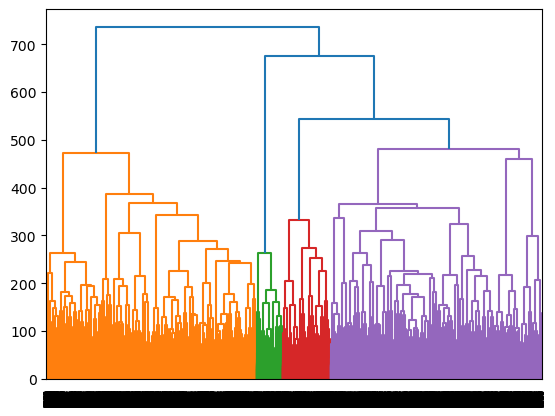

In [ ]:
#hierarchical_cluster = AgglomerativeClustering(n_clusters=6, metric='euclidean', linkage='ward')
#labels = hierarchical_cluster.fit_predict(sampled_matrix)

max_clusters = 10
scores = []
for n_clusters in range(2, max_clusters + 1):
    clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
    labels = clustering.fit_predict(sampled_matrix)
    score = silhouette_score(sampled_matrix, labels)
    print(score)
    scores.append(score)

print(scores)

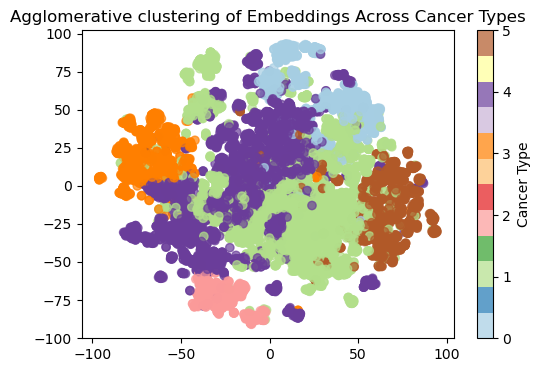

In [27]:
plt.figure(figsize=(6, 4))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=labels, cmap='Paired', alpha=0.7)
colorbar = plt.colorbar(scatter, ticks=range(7), label='Cancer Type')
plt.title('Agglomerative clustering of Embeddings Across Cancer Types')
plt.show()

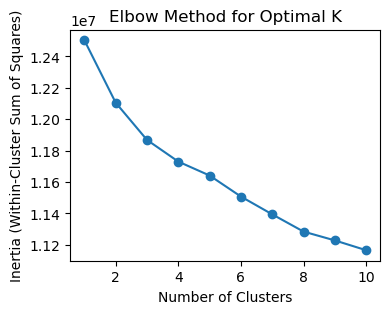

In [37]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Assuming embeddings is your data matrix
inertia = []
max_clusters = 10  # Adjust based on your data

# Run K-means for different numbers of clusters and compute inertia
for n_clusters in range(1, max_clusters + 1):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(sampled_matrix)
    inertia.append(kmeans.inertia_)  # Record the inertia (within-cluster sum of squares)

# Plot the elbow curve
plt.figure(figsize=(4, 3))
plt.plot(range(1, max_clusters + 1), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Within-Cluster Sum of Squares)')
plt.title('Elbow Method for Optimal K')
plt.show()

In [5]:
DB_PATH = '/home/clinical-concepts/maracuja.clinical-concepts/output/TCGA-BRCA/features/'
brca_paths = glob.glob(os.path.join(DB_PATH,'*'))

In [10]:
embeddings = []
patients = []
file_ids = []

for c_p in brca_paths:
    read = LMDBRead(c_p)
    for k in read.get_keys():
        patients.append(c_p)
        image = read.read_image(k)
        embeddings.append(image)
        file_ids.append(k)

In [11]:
labeled_embeds = list(zip(embeddings, patients, file_ids))
labeled_embeds  = random.sample(labeled_embeds,10000)
embeddings, patients, ids = zip(*labeled_embeds)
sampled_matrix = np.vstack(embeddings)

In [12]:
unique_labels = sorted(set(patients))
# Create a mapping dictionary
label_mapping = {label: idx for idx, label in enumerate(unique_labels)}
integer_labels = [label_mapping[label] for label in patients]
labels_id = list(label_mapping.keys())

In [ ]:
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(sampled_matrix)

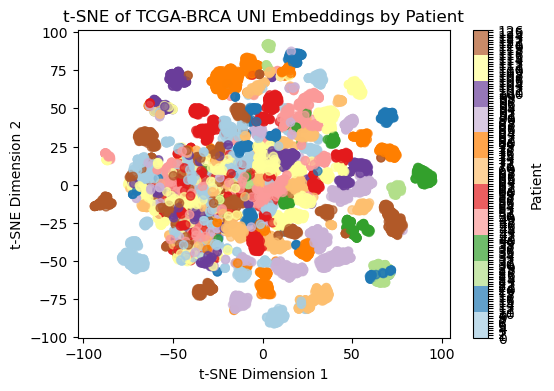

In [173]:
plt.figure(figsize=(6, 4))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=integer_labels, cmap='Paired', alpha=0.7)
colorbar =  plt.colorbar(scatter, ticks=range(len(unique_labels)), label='Patient')


plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('t-SNE of TCGA-BRCA UNI Embeddings by Patient')
plt.savefig('TSNE-TCGA-BRCA')
plt.show()

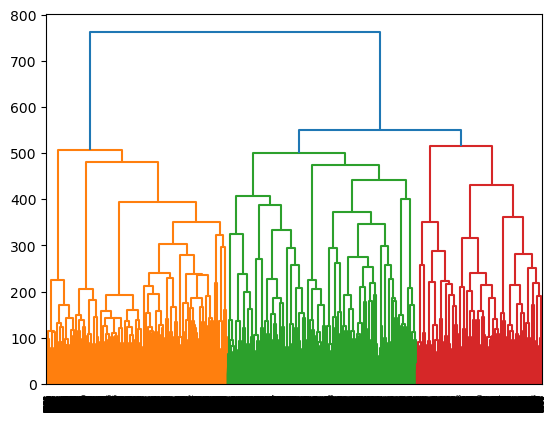

In [9]:
ward_clustering = linkage(sampled_matrix, method='ward', metric="euclidean")
dendrogram(ward_clustering)
plt.savefig('denogram-TCGA-BRCA.png')
plt.show()

In [14]:
hierarchical_cluster = AgglomerativeClustering(n_clusters=7, metric='euclidean', linkage='ward')
clusters = hierarchical_cluster.fit_predict(sampled_matrix)

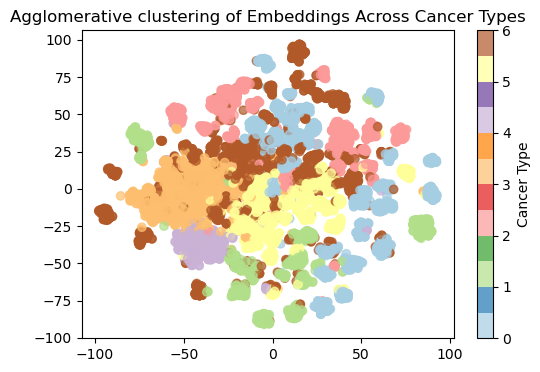

In [71]:
plt.figure(figsize=(6, 4))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=labels, cmap='Paired', alpha=0.7)
colorbar = plt.colorbar(scatter, ticks=range(7), label='Cancer Type')
plt.title('Agglomerative clustering of Embeddings Across Cancer Types')
plt.show()

In [15]:
from scipy.spatial.distance import cdist

labels = np.array([os.path.basename(l) for l in patients])
identifiers = np.array([m_l + '_' + str(m_id) for m_l, m_id in zip(labels, ids)])

# Find the medoid for each cluster
medoids = []
medoid_ids = []
for i in range(7):
    cluster_points = sampled_matrix[clusters == i]
    cluster_ids = identifiers[clusters == i]
    
    distances = cdist(cluster_points, cluster_points, metric='euclidean')
    medoid_index = distances.sum(axis=1).argmin()
    medoid_ids.append(cluster_ids[medoid_index])
    medoids.append(cluster_points[medoid_index])

medoids = np.array(medoids)
#print("Medoids of the clusters:\n", medoids)

In [16]:
nearest_points = {}  # To store the nearest 5 points for each medoid
for medoid, m_id in zip(medoids, medoid_ids):
    distances = cdist([medoid], sampled_matrix, metric='euclidean').flatten()
    nearest_indices = np.argsort(distances)[:5]
    nearest_points[m_id] = identifiers[nearest_indices]

for k, points in nearest_points.items():
    print(f"Medoid {k} nearest embeddings:\n", points)

Medoid TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7_b'63377_71761' nearest embeddings:
 ["TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7_b'63377_71761'"
 "TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7_b'35601_41297'"
 "TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7_b'51729_69969'"
 "TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7_b'69649_31441'"
 "TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7_b'79505_46673'"]
Medoid TCGA-D8-A27R-01Z-00-DX1.F6E2FD1C-0666-4788-8D95-A76D15907270_b'75089_18816' nearest embeddings:
 ["TCGA-D8-A27R-01Z-00-DX1.F6E2FD1C-0666-4788-8D95-A76D15907270_b'75089_18816'"
 "TCGA-D8-A27R-01Z-00-DX1.F6E2FD1C-0666-4788-8D95-A76D15907270_b'73297_31360'"
 "TCGA-D8-A27R-01Z-00-DX1.F6E2FD1C-0666-4788-8D95-A76D15907270_b'53585_40320'"
 "TCGA-D8-A27R-01Z-00-DX1.F6E2FD1C-0666-4788-8D95-A76D15907270_b'81361_56448'"
 "TCGA-D8-A27R-01Z-00-DX1.F6E2FD1C-0666-4788-8D95-A76D15907270_b'90321_28672'"]


In [17]:
patient_labels = []
for k, v in nearest_points.items():
    patient = k.split('_')[0]
    patient_labels.append(patient)
    for p in v:
        patient = p.split('_')[0]
        patient_labels.append(patient)
patient_labels = list(set(patient_labels))


In [102]:
patient_labels

['TCGA-AN-A0FW-01Z-00-DX1.5EEDFC71-6ABE-4189-8C45-2127403A8F04',
 'TCGA-AR-A0TY-01Z-00-DX1.089EB6B4-9921-441D-84F3-C64C97AFC3B4',
 'TCGA-A2-A0ES-01Z-00-DX1.5652EE30-48C1-4EC1-AD77-8C72DFCB9A97',
 'TCGA-BH-A204-01Z-00-DX1.9DCE8242-E862-45AB-9452-D7299110973F',
 'TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7',
 'TCGA-D8-A1XQ-01Z-00-DX1.1A17A5C7-F14B-4AD2-AD5F-D3400D86A366',
 'TCGA-AR-A0TZ-01Z-00-DX1.2D58BE38-03F6-4310-8E06-F1A523FB0904',
 'TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2']

In [106]:
patient_labels

['TCGA-AN-A0FW-01Z-00-DX1.5EEDFC71-6ABE-4189-8C45-2127403A8F04',
 'TCGA-AR-A0TY-01Z-00-DX1.089EB6B4-9921-441D-84F3-C64C97AFC3B4',
 'TCGA-A2-A0ES-01Z-00-DX1.5652EE30-48C1-4EC1-AD77-8C72DFCB9A97',
 'TCGA-BH-A204-01Z-00-DX1.9DCE8242-E862-45AB-9452-D7299110973F',
 'TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7',
 'TCGA-D8-A1XQ-01Z-00-DX1.1A17A5C7-F14B-4AD2-AD5F-D3400D86A366',
 'TCGA-AR-A0TZ-01Z-00-DX1.2D58BE38-03F6-4310-8E06-F1A523FB0904',
 'TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2']

In [ ]:
plt.figure(figsize=(6, 4))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=labels, cmap='Paired', alpha=0.7)
colorbar = plt.colorbar(scatter, ticks=range(7), label='Cancer Type')
plt.title('Agglomerative clustering of Embeddings Across Cancer Types')
plt.show()

In [5]:
import cv2

In [118]:
PATH = "/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/"

Medoid TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7_b'72337_62801'
/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7/TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7_72337_62801.png


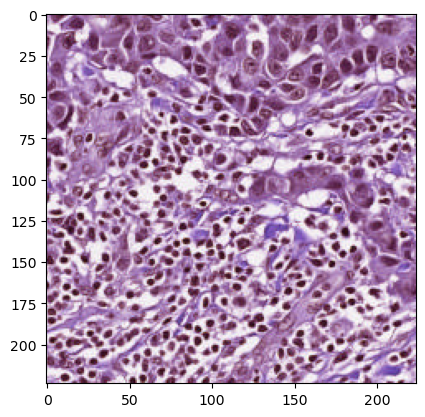

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7/TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7_72337_62801.png


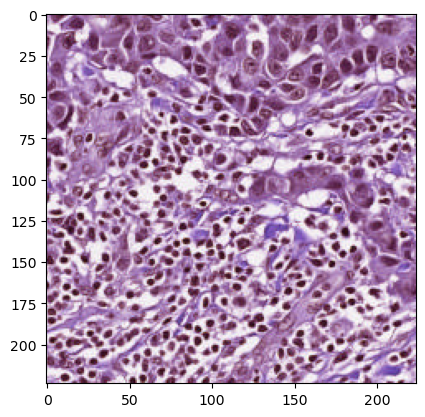

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7/TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7_72337_61009.png


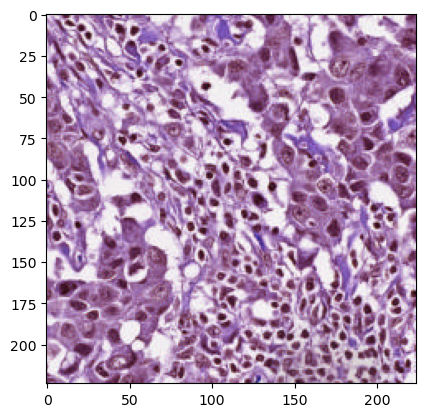

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7/TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7_58001_73553.png


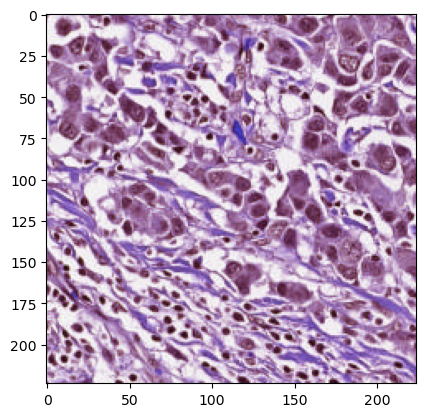

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-D8-A1XQ-01Z-00-DX1.1A17A5C7-F14B-4AD2-AD5F-D3400D86A366/TCGA-D8-A1XQ-01Z-00-DX1.1A17A5C7-F14B-4AD2-AD5F-D3400D86A366_81010_23888.png


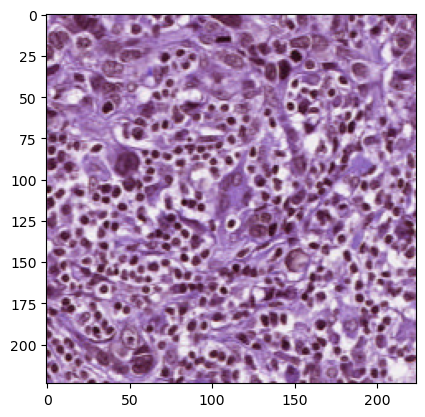

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7/TCGA-EW-A6SD-01Z-00-DX1.32D8240E-2076-492B-BB95-300A9FCA96E7_57105_72657.png


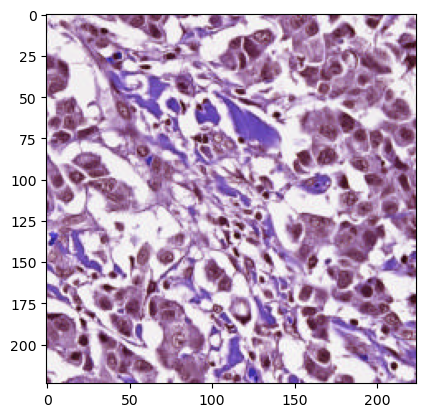

Medoid TCGA-AR-A0TZ-01Z-00-DX1.2D58BE38-03F6-4310-8E06-F1A523FB0904_b'35792_47888'
/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AR-A0TZ-01Z-00-DX1.2D58BE38-03F6-4310-8E06-F1A523FB0904/TCGA-AR-A0TZ-01Z-00-DX1.2D58BE38-03F6-4310-8E06-F1A523FB0904_35792_47888.png


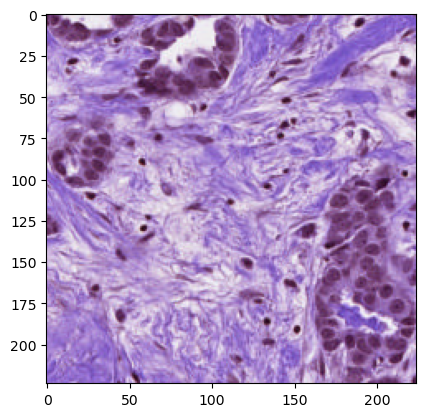

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AR-A0TZ-01Z-00-DX1.2D58BE38-03F6-4310-8E06-F1A523FB0904/TCGA-AR-A0TZ-01Z-00-DX1.2D58BE38-03F6-4310-8E06-F1A523FB0904_35792_47888.png


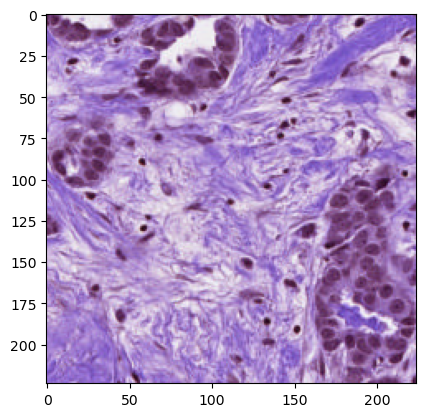

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AR-A0TZ-01Z-00-DX1.2D58BE38-03F6-4310-8E06-F1A523FB0904/TCGA-AR-A0TZ-01Z-00-DX1.2D58BE38-03F6-4310-8E06-F1A523FB0904_33104_28176.png


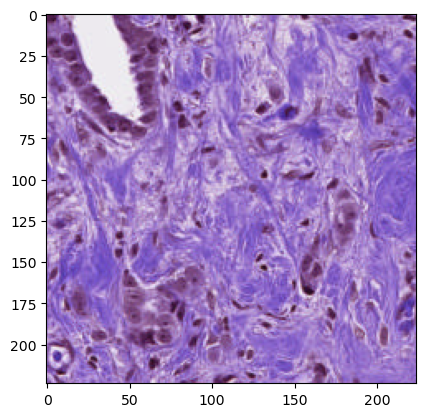

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AR-A0TZ-01Z-00-DX1.2D58BE38-03F6-4310-8E06-F1A523FB0904/TCGA-AR-A0TZ-01Z-00-DX1.2D58BE38-03F6-4310-8E06-F1A523FB0904_35792_50576.png


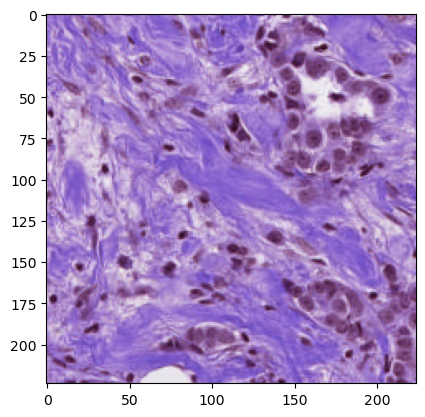

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AR-A0TZ-01Z-00-DX1.2D58BE38-03F6-4310-8E06-F1A523FB0904/TCGA-AR-A0TZ-01Z-00-DX1.2D58BE38-03F6-4310-8E06-F1A523FB0904_32208_17424.png


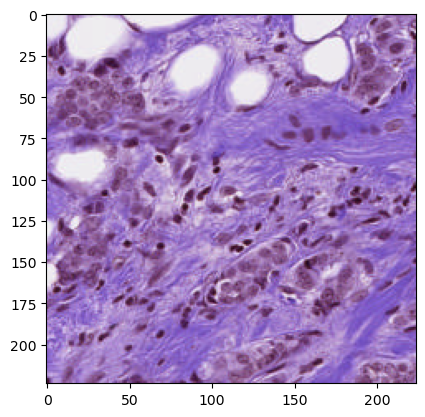

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AR-A0TZ-01Z-00-DX1.2D58BE38-03F6-4310-8E06-F1A523FB0904/TCGA-AR-A0TZ-01Z-00-DX1.2D58BE38-03F6-4310-8E06-F1A523FB0904_28624_49680.png


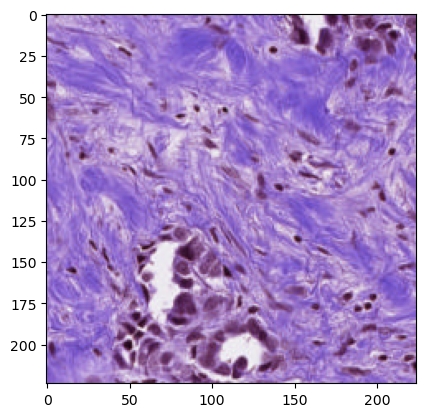

Medoid TCGA-AN-A0FW-01Z-00-DX1.5EEDFC71-6ABE-4189-8C45-2127403A8F04_b'46712_28360'
/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AN-A0FW-01Z-00-DX1.5EEDFC71-6ABE-4189-8C45-2127403A8F04/TCGA-AN-A0FW-01Z-00-DX1.5EEDFC71-6ABE-4189-8C45-2127403A8F04_46712_28360.png


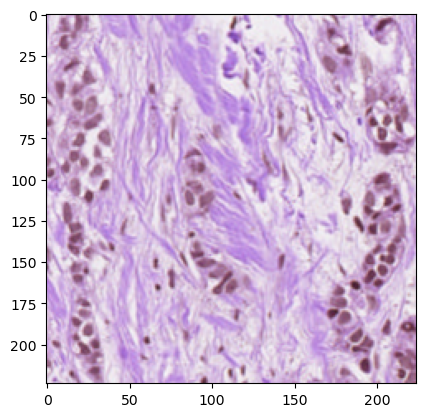

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AN-A0FW-01Z-00-DX1.5EEDFC71-6ABE-4189-8C45-2127403A8F04/TCGA-AN-A0FW-01Z-00-DX1.5EEDFC71-6ABE-4189-8C45-2127403A8F04_46712_28360.png


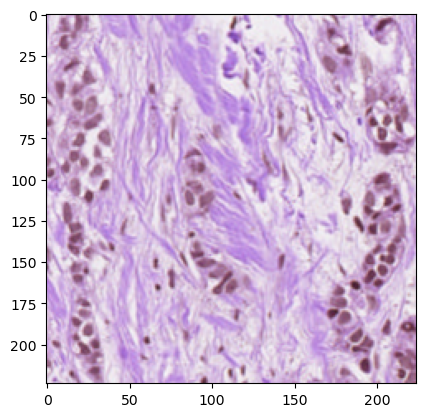

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AN-A0FW-01Z-00-DX1.5EEDFC71-6ABE-4189-8C45-2127403A8F04/TCGA-AN-A0FW-01Z-00-DX1.5EEDFC71-6ABE-4189-8C45-2127403A8F04_46712_24776.png


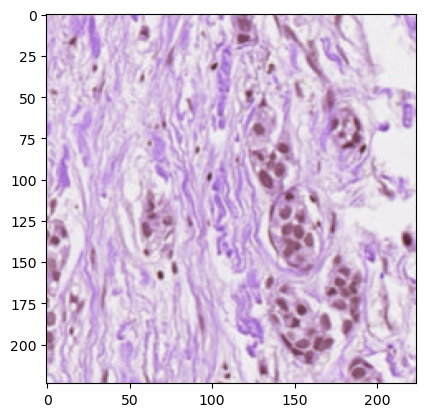

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AN-A0FW-01Z-00-DX1.5EEDFC71-6ABE-4189-8C45-2127403A8F04/TCGA-AN-A0FW-01Z-00-DX1.5EEDFC71-6ABE-4189-8C45-2127403A8F04_44920_30152.png


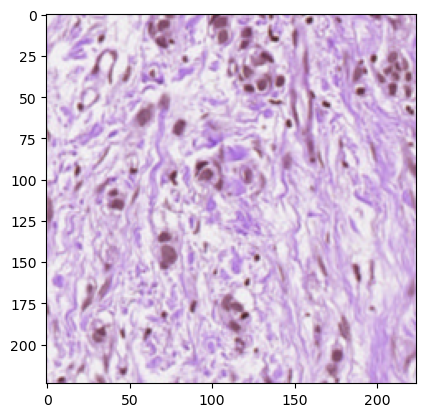

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AN-A0FW-01Z-00-DX1.5EEDFC71-6ABE-4189-8C45-2127403A8F04/TCGA-AN-A0FW-01Z-00-DX1.5EEDFC71-6ABE-4189-8C45-2127403A8F04_35960_11336.png


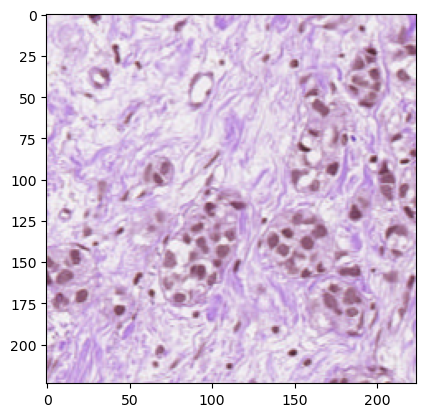

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AN-A0FW-01Z-00-DX1.5EEDFC71-6ABE-4189-8C45-2127403A8F04/TCGA-AN-A0FW-01Z-00-DX1.5EEDFC71-6ABE-4189-8C45-2127403A8F04_19832_22088.png


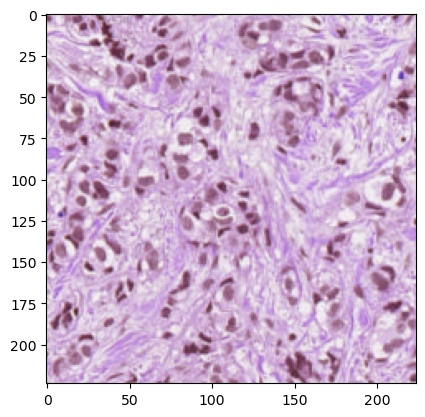

Medoid TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2_b'20001_16737'
/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2_20001_16737.png


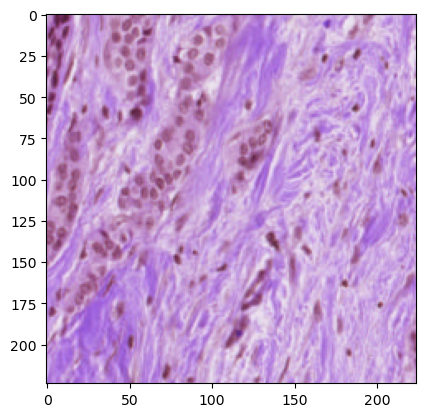

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2_20001_16737.png


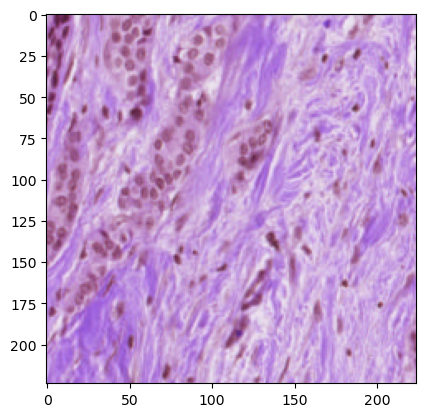

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2_23585_15841.png


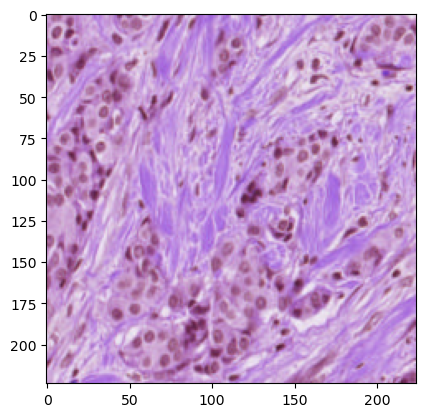

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2_17313_13153.png


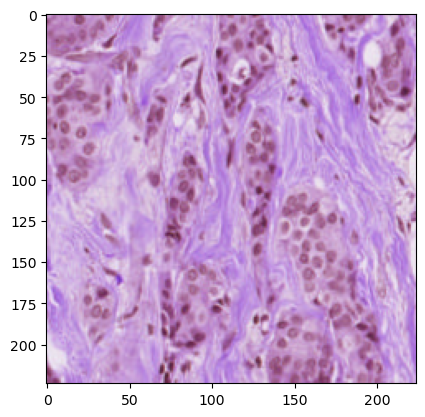

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2_14625_12257.png


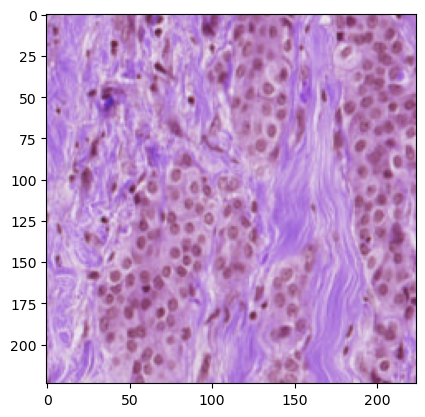

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2_43297_48993.png


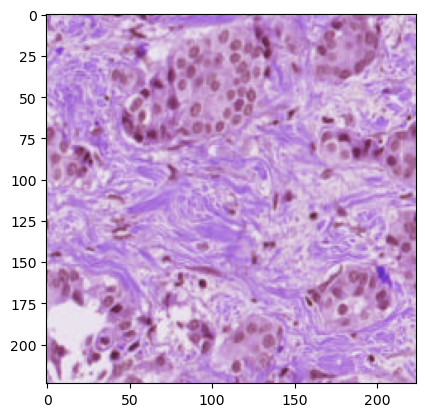

Medoid TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2_b'123041_52577'
/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2_123041_52577.png


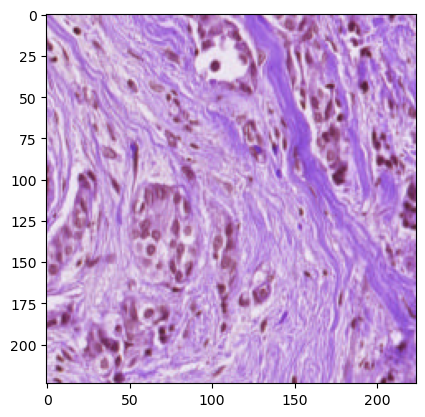

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2_123041_52577.png


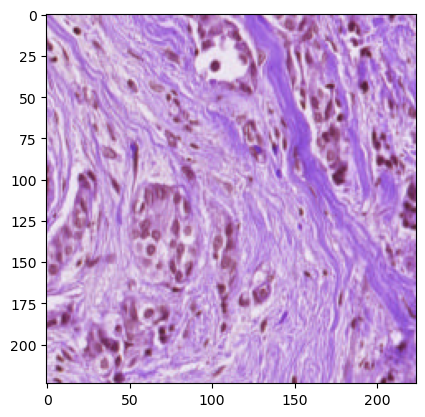

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2_20001_16737.png


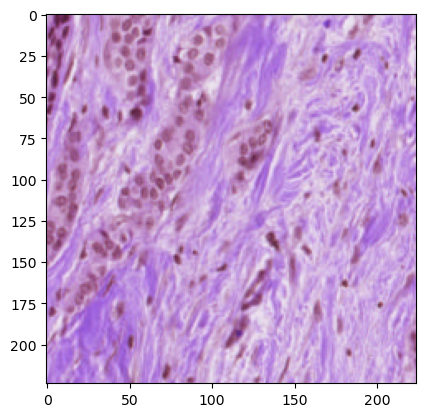

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2_105121_40033.png


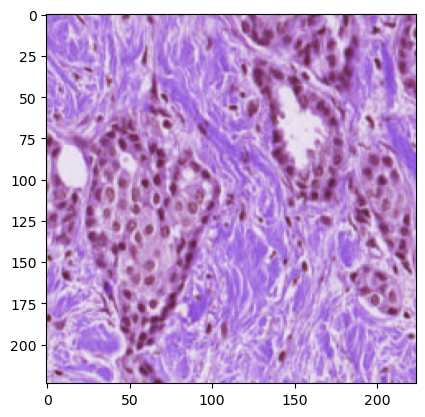

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2_43297_48993.png


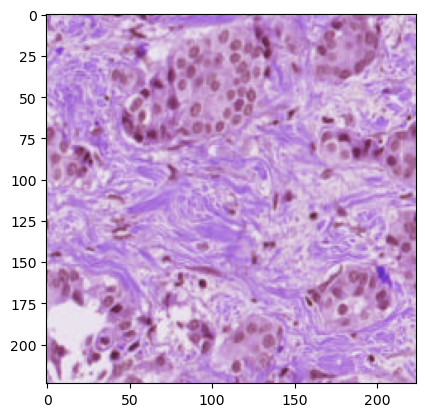

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2/TCGA-BH-A1ET-01Z-00-DX1.05C126CD-CC10-44BF-9A68-6CDDE97272B2_45985_47201.png


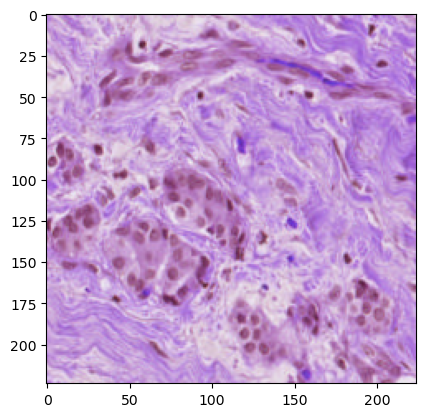

Medoid TCGA-AR-A0TY-01Z-00-DX1.089EB6B4-9921-441D-84F3-C64C97AFC3B4_b'20464_38512'
/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AR-A0TY-01Z-00-DX1.089EB6B4-9921-441D-84F3-C64C97AFC3B4/TCGA-AR-A0TY-01Z-00-DX1.089EB6B4-9921-441D-84F3-C64C97AFC3B4_20464_38512.png


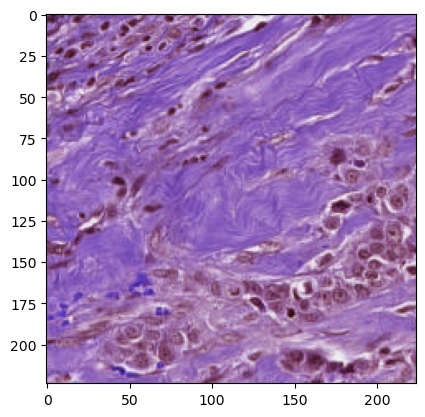

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AR-A0TY-01Z-00-DX1.089EB6B4-9921-441D-84F3-C64C97AFC3B4/TCGA-AR-A0TY-01Z-00-DX1.089EB6B4-9921-441D-84F3-C64C97AFC3B4_20464_38512.png


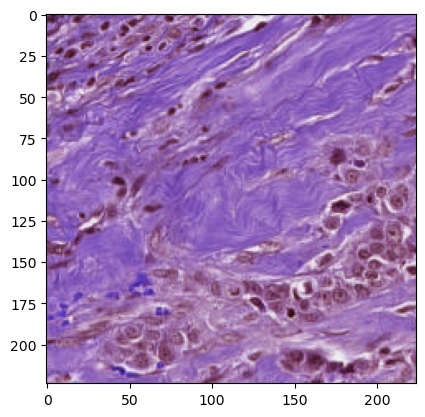

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AR-A0TY-01Z-00-DX1.089EB6B4-9921-441D-84F3-C64C97AFC3B4/TCGA-AR-A0TY-01Z-00-DX1.089EB6B4-9921-441D-84F3-C64C97AFC3B4_39280_34032.png


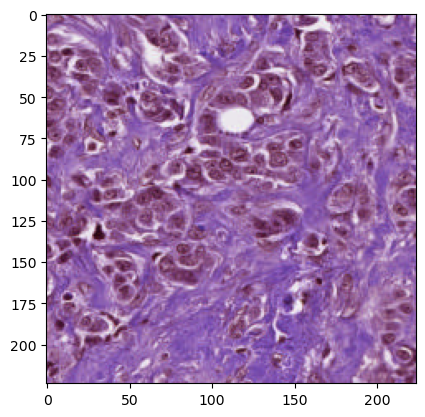

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AR-A0TY-01Z-00-DX1.089EB6B4-9921-441D-84F3-C64C97AFC3B4/TCGA-AR-A0TY-01Z-00-DX1.089EB6B4-9921-441D-84F3-C64C97AFC3B4_20464_32240.png


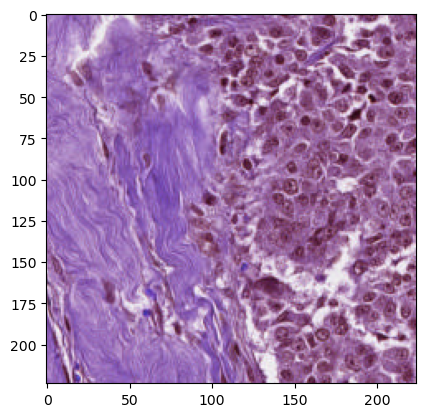

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-AR-A0TY-01Z-00-DX1.089EB6B4-9921-441D-84F3-C64C97AFC3B4/TCGA-AR-A0TY-01Z-00-DX1.089EB6B4-9921-441D-84F3-C64C97AFC3B4_39280_37616.png


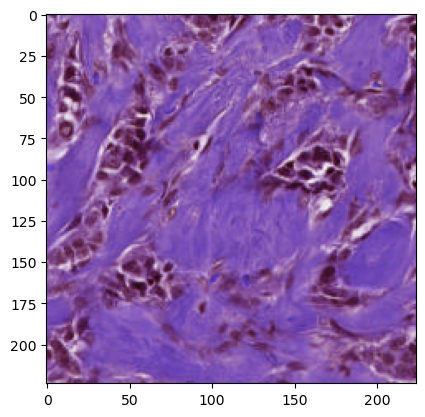

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-BH-A204-01Z-00-DX1.9DCE8242-E862-45AB-9452-D7299110973F/TCGA-BH-A204-01Z-00-DX1.9DCE8242-E862-45AB-9452-D7299110973F_67312_37328.png


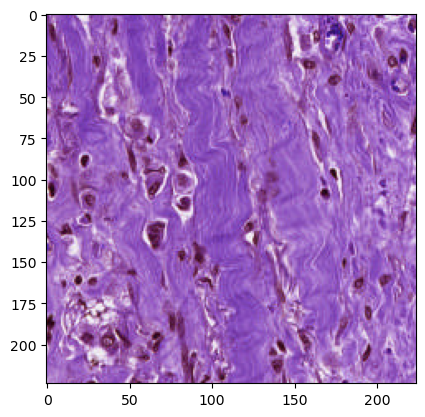

Medoid TCGA-A2-A0ES-01Z-00-DX1.5652EE30-48C1-4EC1-AD77-8C72DFCB9A97_b'25632_61824'
/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-A2-A0ES-01Z-00-DX1.5652EE30-48C1-4EC1-AD77-8C72DFCB9A97/TCGA-A2-A0ES-01Z-00-DX1.5652EE30-48C1-4EC1-AD77-8C72DFCB9A97_25632_61824.png


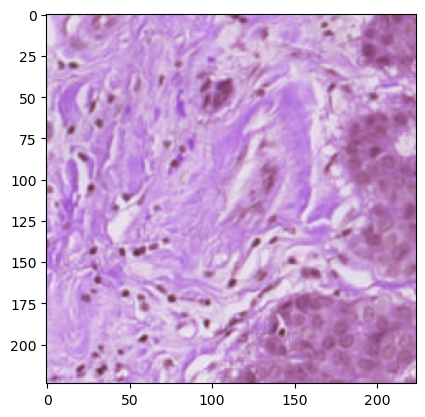

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-A2-A0ES-01Z-00-DX1.5652EE30-48C1-4EC1-AD77-8C72DFCB9A97/TCGA-A2-A0ES-01Z-00-DX1.5652EE30-48C1-4EC1-AD77-8C72DFCB9A97_25632_61824.png


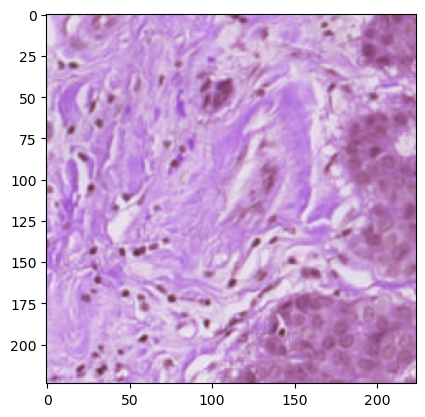

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-A2-A0ES-01Z-00-DX1.5652EE30-48C1-4EC1-AD77-8C72DFCB9A97/TCGA-A2-A0ES-01Z-00-DX1.5652EE30-48C1-4EC1-AD77-8C72DFCB9A97_115232_56448.png


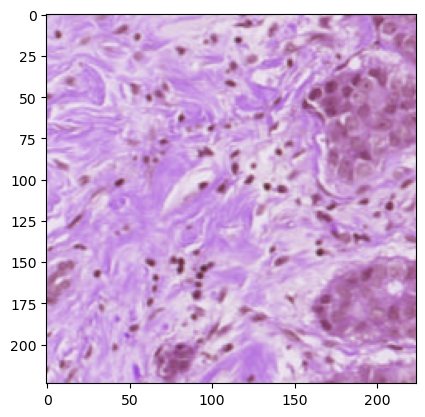

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-A2-A0ES-01Z-00-DX1.5652EE30-48C1-4EC1-AD77-8C72DFCB9A97/TCGA-A2-A0ES-01Z-00-DX1.5652EE30-48C1-4EC1-AD77-8C72DFCB9A97_27424_53760.png


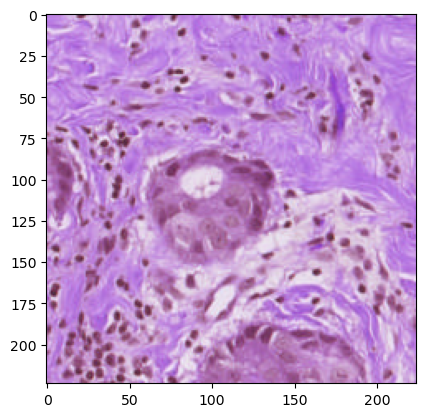

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-A2-A0ES-01Z-00-DX1.5652EE30-48C1-4EC1-AD77-8C72DFCB9A97/TCGA-A2-A0ES-01Z-00-DX1.5652EE30-48C1-4EC1-AD77-8C72DFCB9A97_129568_27776.png


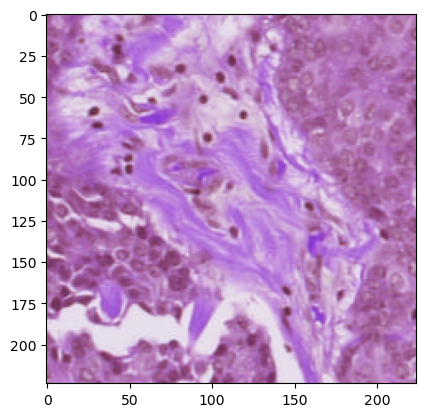

/home/clinical-concepts/maracuja.clinical-concepts/output/tiles2/TCGA-BRCA/tiles/TCGA-A2-A0ES-01Z-00-DX1.5652EE30-48C1-4EC1-AD77-8C72DFCB9A97/TCGA-A2-A0ES-01Z-00-DX1.5652EE30-48C1-4EC1-AD77-8C72DFCB9A97_124192_43904.png


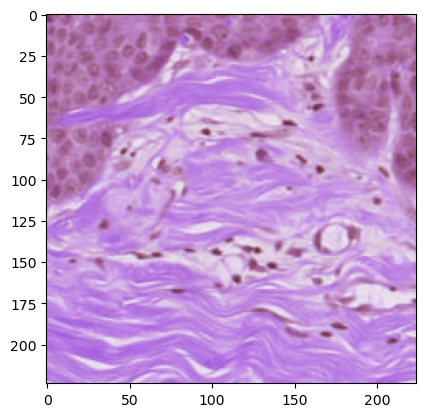

In [121]:
for k, points in nearest_points.items():
    print(f"Medoid {k}")
    path = PATH + k.split('_')[0] + '/' + k.split('_')[0] + '_' + k.split('b')[1][1:-1] + '.png'
    image = cv2.imread(path)
    print(path)
    plt.imshow(image)
    plt.show()
    for p in points:
        path = PATH + p.split('_')[0] + '/' + p.split('_')[0] + '_' + p.split('b')[1][1:-1] + '.png'
        image = cv2.imread(path)
        print(path)
        plt.imshow(image)
        plt.show()
        
    
    

In [16]:
#Medoid TCGA-S3-AA12-01Z-00-DX1.2A991B9F-E7E6-410B-B0BF-635E3CC40C7E_b'12305_38160' nearest embeddings:
image1 = cv2.imread('output/tiles/TCGA-BRCA/tiles/TCGA-E9-A245-01Z-00-DX1.648850D5-EB80-4FBE-8507-32313FAD1060_66961_46514.png')
image2 = cv2.imread('output/tiles/TCGA-BRCA/tiles/TCGA-E9-A245-01Z-00-DX1.648850D5-EB80-4FBE-8507-32313FAD1060_69649_49202.png')
image3 = cv2.imread('output/tiles/TCGA-BRCA/tiles/TCGA-E9-A245-01Z-00-DX1.648850D5-EB80-4FBE-8507-32313FAD1060_69649_48306.png')
image4 = cv2.imread('output/tiles/TCGA-BRCA/tiles/TCGA-E9-A245-01Z-00-DX1.648850D5-EB80-4FBE-8507-32313FAD1060_67857_48306.png')
#image5 = cv2.imread('output/tiles/TCGA-BRCA/tiles/TCGA-E9-A245-01Z-00-DX1.648850D5-EB80-4FBE-8507-32313FAD1060_66961_46514.png')


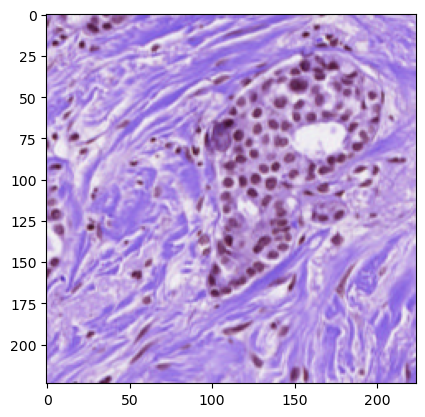

In [14]:
plt.imshow(image1)

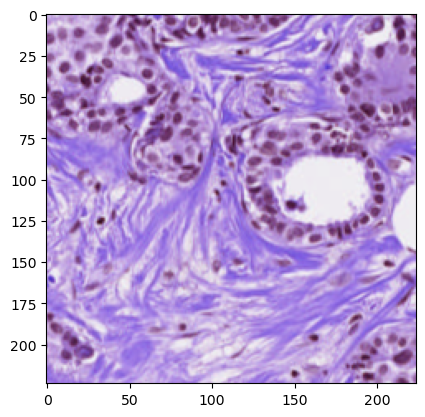

In [17]:
plt.imshow(image2)

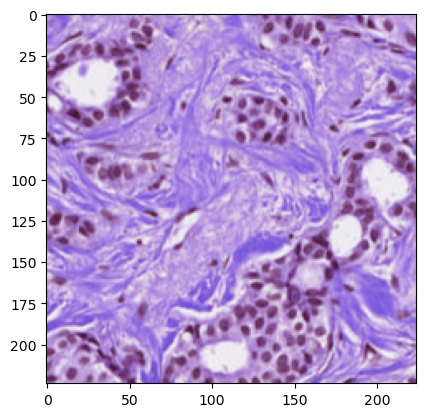

In [18]:
plt.imshow(image3)

### 